# Evaluate embedding model

In [1]:
import os
import yaml
from pathlib import Path
from tqdm.notebook import tqdm
import numpy as np
import pandas as pd
import plotly.graph_objects as go

In [2]:
import torch
from torch_geometric.loader import DataLoader

In [3]:
from sphenix_benchmark.datasets.tpc_dataset import TPCDataset
from sphenix_benchmark.preprocessor.data_processor import Processor
from sphenix_benchmark.models.mlp import MLP
from sphenix_benchmark.models.losses import HingeLoss
from sphenix_benchmark.metrics import compute_roc, compute_pr

In [4]:
import sys
sys.path.append('../utils')
from plots import plot_distribution, plot_roc_curve, plot_pr_curve

In [5]:
! nvidia-smi

Wed May 21 22:59:36 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 555.42.02              Driver Version: 555.42.02      CUDA Version: 12.5     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA RTX A6000               Off |   00000000:01:00.0 Off |                  Off |
| 30%   33C    P8             31W /  300W |      18MiB /  49140MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

## Load data and model

In [6]:
# set up device
os.environ['CUDA_DEVICE_ORDER'] = 'PCI_BUS_ID'
gpu_id = 0
torch.cuda.set_device(gpu_id)
device = 'cuda'

# load configuration
checkpoint_path = Path('checkpoints')
config_fname = checkpoint_path/'config.yaml'
with open(config_fname, 'r', encoding='UTF-8') as handle:
    config = yaml.safe_load(handle)

# load data
valid_ds  = TPCDataset(split='test', **config['data'])
valid_ldr = DataLoader(valid_ds,
                       batch_size = config['train']['batch_size'],
                       shuffle    = True)

# data processor
data_processor = Processor(**config['data_processor'])

# loss function
loss_fn = torch.nn.BCEWithLogitsLoss()

# construct and load model
epoch = 'last'
model = torch.jit.load(checkpoint_path/f'ckpt_{epoch}.script')
model.to(device)

RecursiveScriptModule(
  original_name=Model
  (embedding_model): RecursiveScriptModule(
    original_name=MLP
    (model): RecursiveScriptModule(
      original_name=Sequential
      (0): RecursiveScriptModule(original_name=Linear)
      (1): RecursiveScriptModule(original_name=BatchNorm1d)
      (2): RecursiveScriptModule(original_name=LeakyReLU)
      (3): RecursiveScriptModule(original_name=Linear)
      (4): RecursiveScriptModule(original_name=BatchNorm1d)
      (5): RecursiveScriptModule(original_name=LeakyReLU)
      (6): RecursiveScriptModule(original_name=Linear)
    )
  )
  (filter_model): RecursiveScriptModule(
    original_name=MLP
    (model): RecursiveScriptModule(
      original_name=Sequential
      (0): RecursiveScriptModule(original_name=Linear)
      (1): RecursiveScriptModule(original_name=BatchNorm1d)
      (2): RecursiveScriptModule(original_name=LeakyReLU)
      (3): RecursiveScriptModule(original_name=Linear)
      (4): RecursiveScriptModule(original_name=BatchN

## Evaluate one event

number of queries = 70268
same-track queries = 62101
diff-track queries = 8167


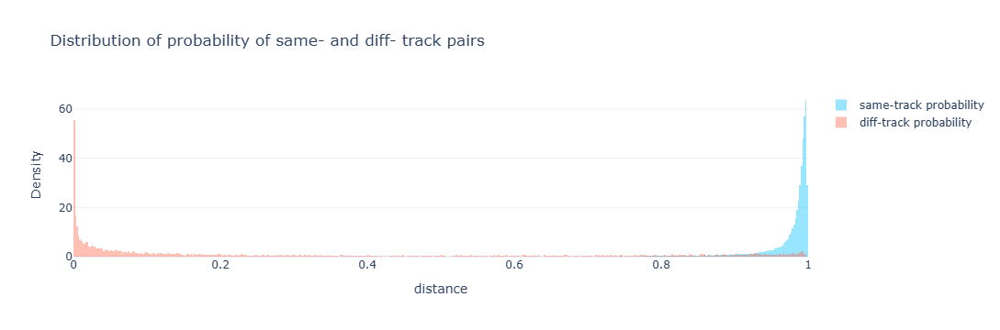

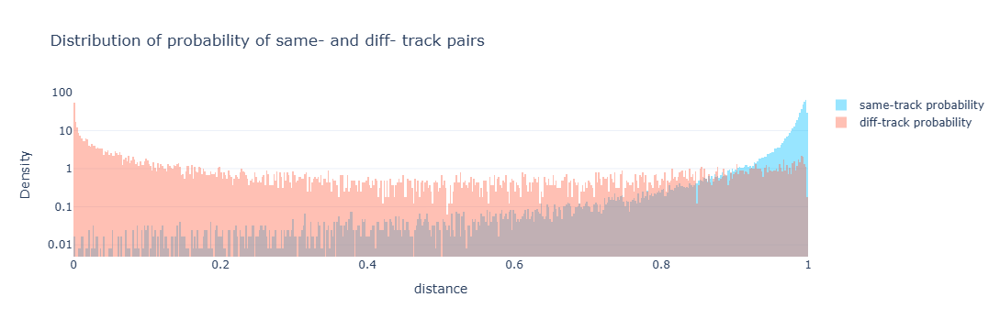

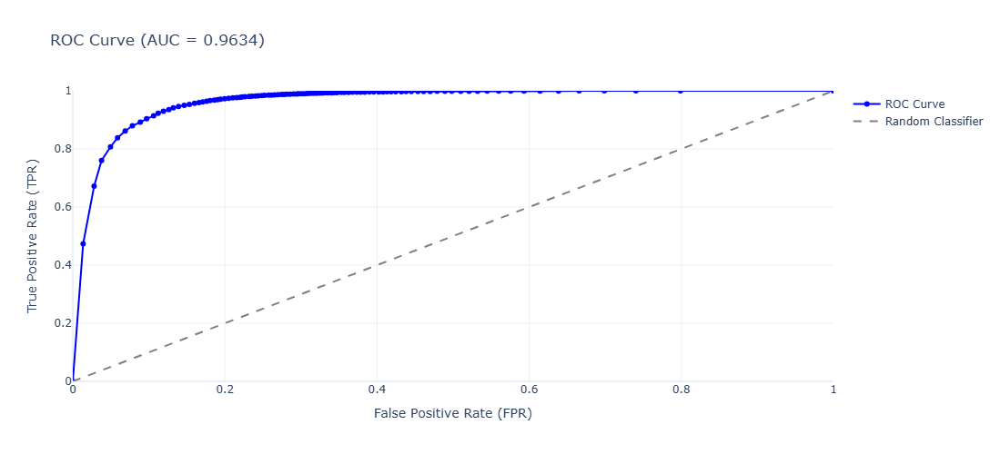

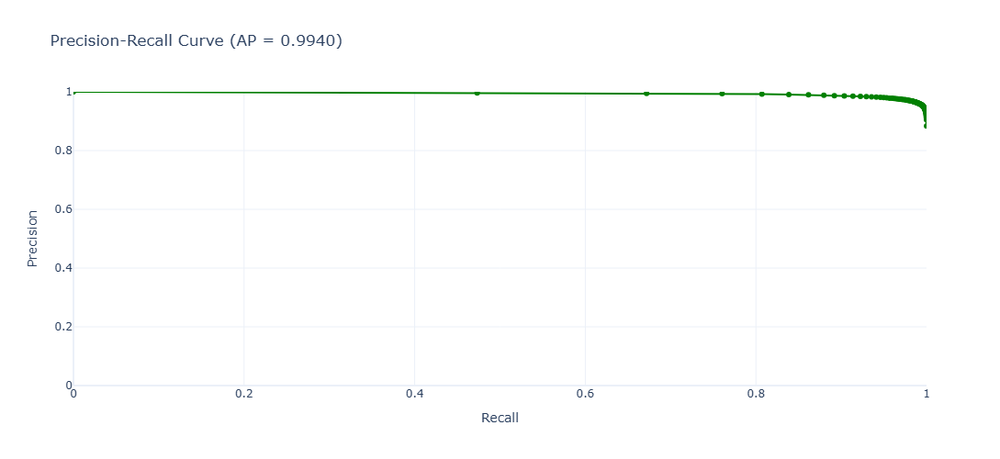

In [8]:
data = next(iter(valid_ldr))

points    = data['features'].x[:, 1:].to(device)
track_ids = data['seg_target'].x.to(device)
batch     = data['features'].batch.to(device)

# processing input
head, tail, labels = data_processor.get_knn_queries(
    points    = points,
    track_ids = track_ids,
    batch     = batch,
    fraction  = .2
)

logits = model(head, tail).squeeze()
probs = torch.sigmoid(logits)

print(f'number of queries = {len(probs)}')
print(f'same-track queries = {len(probs[labels])}')
print(f'diff-track queries = {len(probs[~labels])}')

# Calculate and evaluate performance 
plot_distribution(probs, labels, data_type='probability', log_y=False)
plot_distribution(probs, labels, data_type='probability', log_y=True)
# ROC curve
fpr, tpr, auc = compute_roc(probs, labels, num_thresholds=100)
plot_roc_curve(fpr, tpr, auc)
# PR curve
recall, precision, average_precision = compute_pr(probs, labels, num_thresholds=100)
plot_pr_curve(recall, precision, average_precision)

## Evaluate all validation events

1. load reg_target too for calculating pT
2. return head and tail indices

In [28]:
config['data']['target'] = ['reg', 'seg']
valid_ds  = TPCDataset(split='test', **config['data'])
valid_ldr = DataLoader(valid_ds, batch_size=1, shuffle=False)

pbar = tqdm(enumerate(valid_ldr, start=1), total=len(valid_ldr))

columns = ['head_eta', 'head_cos', 'head_sin', 'head_radius',
           'tail_eta', 'tail_cos', 'tail_sin', 'tail_radius', 
           'label', 
           'prob', 
           'head_track_id', 
           'tail_track_id', 
           'head_pT', 
           'tail_pT']

dfs = []
for event_id, data in pbar:
    points    = data['features'].x[:, 1:].to(device)
    track_ids = data['seg_target'].x.to(device)
    particles = data['reg_target'].x.to(device)
    batch     = data['features'].batch.to(device)

    # processing input
    head, tail, labels, head_indices, tail_indices = data_processor.get_knn_queries(
        points         = points,
        track_ids      = track_ids,
        batch          = batch,
        fraction       = .05, 
        return_indices = True
    )
    logits = model(head, tail).squeeze()
    probs = torch.sigmoid(logits)

    head_track_ids = track_ids[head_indices]
    tail_track_ids = track_ids[tail_indices]
    
    head_particles = particles[head_indices]
    tail_particles = particles[tail_indices]
    
    px, py = head_particles[:, [1, 2]].T
    head_pT = (px ** 2 + py ** 2).sqrt()
    
    px, py = tail_particles[:, [1, 2]].T
    tail_pT = (px ** 2 + py ** 2).sqrt()

    # multi-dimensional input coordinates 
    record_points = torch.hstack([head[:, :4], tail[:, :4]])
    # 1-d informations
    record_others = torch.stack([labels, 
                                 probs, 
                                 head_track_ids.float(), 
                                 tail_track_ids.float(), 
                                 head_pT, 
                                 tail_pT]).T
    df = pd.DataFrame(data=torch.hstack([record_points, record_others]).detach().cpu().numpy(),
                      columns = columns)
    df['event_id'] = event_id
    df[['label', 'head_track_id', 'tail_track_id']] = df[['label', 'head_track_id', 'tail_track_id']].astype(int)
    dfs.append(df)
    # logits = model(head, tail).squeeze()
    # probs = torch.sigmoid(logits)

    # df = pd.DataFrame(data={'prob': probs: })
    # same_probs = probs[labels]
    # diff_probs = probs[~labels]

    # true_pos_count = (same_probs > threshold).sum()
    # recall =  true_pos_count / same_probs.numel()
    # precision = true_pos_count / (probs > threshold).sum()
    
    # false_pos_rate = (diff_probs > threshold).sum() / diff_probs.numel()
    
    # stat = {'total_points': len(points), 
    #         'num_queries': len(head),
    #         'num_same_track_queries': len(probs[labels]), 
    #         'recall': recall.item(), 
    #         'precision': precision.item(), 
    #         'false_pos_rate': false_pos_rate.item()}
    
    # stats.append(stat)
# print(total)
df_combined = pd.concat(dfs, axis=0)
df_combined.to_csv(checkpoint_path/'test.csv', index=False)

  0%|          | 0/13193 [00:00<?, ?it/s]

## Evaluation all test events and find a threshold

In [9]:
df = pd.read_csv(checkpoint_path/'test.csv')

In [13]:
threshold = .8
pred_label = df['prob'] > threshold
label = df['label'].astype(bool)

false_pos = pred_label & ~label
false_pos_rate = false_pos.sum() / (~label).sum()

true_pos = pred_label & label
true_pos_rate = true_pos.sum() / (label.sum())

print(f'false pos rate = {false_pos_rate}')
print(f'true pos rate = {true_pos_rate}')

false pos rate = 0.20370819195346582
true pos rate = 0.9585652915034384


In [51]:
radius = sorted(df['tail_radius'].unique())

In [93]:
df['radius_diff'] = df.head_radius - df.tail_radius
df_adj = df[label & (df.radius_diff.abs() > 0) & (df.radius_diff.abs() < 0.0209)]

In [95]:
df_adj_sampled = df_adj.sample(100000)

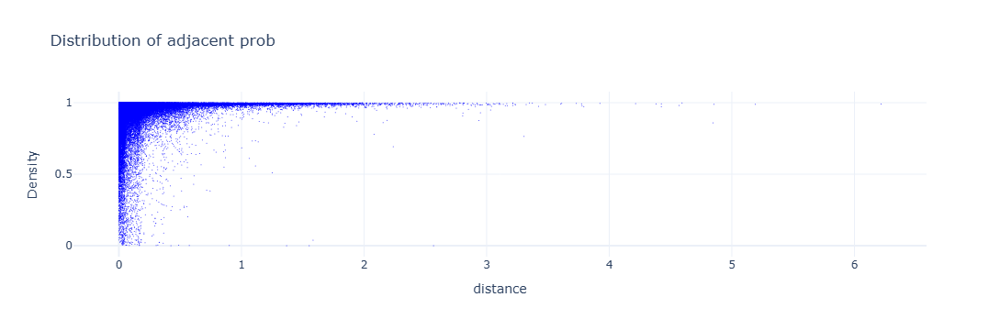

In [96]:
fig = go.Figure()
log_y = False
# distance of different-track pairs
trace = go.Scatter(
    x=df_adj_sampled['head_pT'],
    y=df_adj_sampled['prob'],
    mode='markers',  # Display data points as markers
    marker=dict(
        size=1,
        color='blue',
        opacity=0.8
    )
)
fig.add_trace(trace)
fig.update_layout(
    barmode='overlay',
    title=f'Distribution of adjacent prob',
    xaxis=dict(title='distance'),
    yaxis=dict(title='Density', type='log' if log_y else 'linear'),
    template='plotly_white'
)

fig.show()

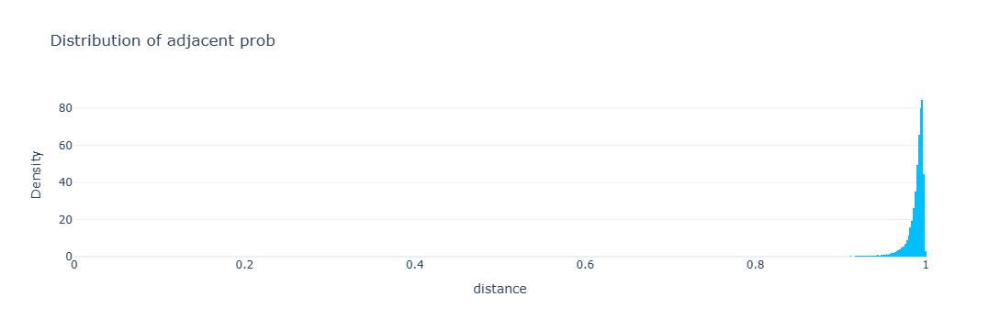

In [84]:
fig = go.Figure()
log_y = False
# distance of different-track pairs
trace = go.Histogram(
    x=df_adj['prob'],
    opacity=1,
    marker_color='deepskyblue',
    histnorm='probability density'
)
fig.add_trace(trace)
fig.update_layout(
    barmode='overlay',
    title=f'Distribution of adjacent prob',
    xaxis=dict(title='distance'),
    yaxis=dict(title='Density', type='log' if log_y else 'linear'),
    template='plotly_white'
)

fig.show()

In [ ]:
2185702

In [83]:
df_adj

,head_eta,head_cos,head_sin,head_radius,tail_eta,tail_cos,tail_sin,tail_radius,label,prob,head_track_id,tail_track_id,head_pT,tail_pT,event_id,radius_diff
37,-0.432305,0.684827,0.728706,0.437500,-0.430044,0.683275,0.730162,0.416667,1,0.994158,2,2,1.323640,1.323640,1,0.020833
75,-0.430044,0.683275,0.730162,0.416667,-0.432305,0.684827,0.728706,0.437500,1,0.995492,2,2,1.323640,1.323640,1,-0.020833
80,-0.787680,0.517475,-0.855699,0.333333,-0.783134,0.516586,-0.856236,0.354167,1,0.996724,32,32,2.034110,2.034110,1,-0.020833
147,-0.045744,0.467410,0.884041,0.020833,-0.045992,0.467434,0.884028,0.000000,1,0.998058,27,27,1.058850,1.058850,1,0.020833
159,-0.778385,0.507381,-0.861722,0.458333,-0.783326,0.508398,-0.861122,0.437500,1,0.998943,32,32,2.034110,2.034110,1,0.020833
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11343139,0.606913,-0.593347,-0.804947,0.395833,0.593883,-0.592861,-0.805305,0.416667,1,0.993256,-22891,-22891,1.127107,1.127107,13193,-0.020833
11343202,0.717843,-0.767065,0.641569,0.041667,0.714333,-0.766078,0.642748,0.020833,1,0.980518,31,31,1.717485,1.717485,13193,0.020833
11343360,-0.742411,-0.933791,0.357819,0.270833,-0.741080,-0.934259,0.356595,0.291667,1,0.996980,21,21,1.051457,1.051457,13193,-0.020833
11343387,0.765569,-0.604315,-0.796746,0.104167,0.775048,-0.605559,-0.795800,0.083333,1,0.984141,-22891,-22891,1.127107,1.127107,13193,0.020833
